In [1]:
import numpy as np
import time, os, sys
from urllib.parse import urlparse
import matplotlib.pyplot as plt
import matplotlib as mpl
%matplotlib inline
mpl.rcParams['figure.dpi'] = 300
from cellpose import utils, io
import json
import skimage
import skimage.io
import skimage.draw
from cellpose import metrics
from cellpose import models, io
from cellpose import plot

In [2]:
class CellsDataset(utils.Dataset):

    def load_cell(self, dataset_dir, subset):
        """Load a subset of the Balloon dataset.
        dataset_dir: Root directory of the dataset.
        subset: Subset to load: train or val
        """
        # Add classes. We have only one class to add.
        self.add_class("cell", 1, "cell")

        # Train or validation dataset?
        assert subset in ["train", "val"]
        dataset_dir = os.path.join(dataset_dir, subset)

        # Load annotations
        # VGG Image Annotator saves each image in the form:
        # { 'filename': '28503151_5b5b7ec140_b.jpg',
        #   'regions': {
        #       '0': {
        #           'region_attributes': {},
        #           'shape_attributes': {
        #               'all_points_x': [...],
        #               'all_points_y': [...],
        #               'name': 'polygon'}},
        #       ... more regions ...
        #   },
        #   'size': 100202
        # }
        # We mostly care about the x and y coordinates of each region
        annotations = json.load(open(os.path.join(dataset_dir, "rois.json")))
        annotations = list(annotations.values())  # don't need the dict keys
        
        # The VIA tool saves images in the JSON even if they don't have any
        # annotations. Skip unannotated images.
        annotations = [a for a in annotations if a['regions']]

        # Add images
        for a in annotations:
            #print(a)
            # Get the x, y coordinaets of points of the polygons that make up
            # the outline of each object instance. There are stores in the
            # shape_attributes (see json format above)
            polygons = [r['shape_attributes'] for r in a['regions']]

            # load_mask() needs the image size to convert polygons to masks.
            # Unfortunately, VIA doesn't include it in JSON, so we must read
            # the image. This is only managable since the dataset is tiny.
            image_path = os.path.join(dataset_dir, a['filename'])
            image = skimage.io.imread(image_path)
            height, width = image.shape[:2]

            self.add_image(
                "cell",
                image_id=a['filename'],  # use file name as a unique image id
                path=image_path,
                width=width, height=height,
                polygons=polygons)

    def load_mask(self, image_id):
        """Generate instance masks for an image.
       Returns:
        masks: A bool array of shape [height, width, instance count] with
            one mask per instance.
        class_ids: a 1D array of class IDs of the instance masks.
        """
        # If not a balloon dataset image, delegate to parent class.
        image_info = self.image_info[image_id]
        if image_info["source"] != "cell":
            return super(self.__class__, self).load_mask(image_id)

        # Convert polygons to a bitmap mask of shape
        # [height, width, instance_count]
        info = self.image_info[image_id]
        mask = np.zeros([info["height"], info["width"]],
                        dtype=np.uint8)
        for i, p in enumerate(info["polygons"]):
            # Get indexes of pixels inside the polygon and set them to 1
            rr, cc = skimage.draw.polygon(p['all_points_y'], p['all_points_x'])
            try:
                mask[rr, cc] = i+1
            except IndexError:
                rr[rr==info["height"]] = info["height"]-1
                cc[cc==info["width"]] = info["width"]-1
                mask[rr, cc] = i+1

        # Return mask, and array of class IDs of each instance. Since we have
        # one class ID only, we return an array of 1s
        return mask, np.ones([mask.shape[-1]], dtype=np.int32)

    def image_reference(self, image_id):
        """Return the path of the image."""
        info = self.image_info[image_id]
        if info["source"] == "cell":
            return info["path"]
        else:
            super(self.__class__, self).image_reference(image_id)


In [3]:
model = models.Cellpose(gpu=False, model_type='cyto')

>>>> using CPU
Running test snippet to check if MKL-DNN working
see https://pytorch.org/docs/stable/backends.html?highlight=mkl
** MKL version working - CPU version is sped up. **


In [4]:
# val = [file for file in os.listdir('val') if '.png' in file]
channels = [2, 0]
tresholds = np.arange(0.5, 1.05, 0.05)

In [5]:
ds = CellsDataset()
ds.load_cell('','val')
ds.prepare()

In [6]:
gts = []
preds = []
flows = []
for i in ds.image_ids:
    ap = np.array(())
    img = ds.load_image(i)
    mask_pred, flows_, styles, diams = model.eval(img, diameter=None, channels=channels)
    mask_gt = ds.load_mask(i)[0]
    gts.append(mask_gt)
    preds.append(mask_pred)
    flows.append(flows_[0])

processing 1 image(s)
computing styles from images
time spent: running network 5.98s; flow+mask computation 1.78
estimated cell diameters for 1 image(s) in 14.91 sec
>>> diameter(s) =  [31.89527295]
time spent: running network 29.71s; flow+mask computation 1.64
estimated masks for 1 image(s) in 31.37 sec
>>>> TOTAL TIME 46.28 sec
processing 1 image(s)
computing styles from images
time spent: running network 5.83s; flow+mask computation 0.95
estimated cell diameters for 1 image(s) in 13.54 sec
>>> diameter(s) =  [31.63363559]
time spent: running network 25.35s; flow+mask computation 0.90
estimated masks for 1 image(s) in 26.27 sec
>>>> TOTAL TIME 39.81 sec
processing 1 image(s)
computing styles from images
time spent: running network 10.66s; flow+mask computation 2.24
estimated cell diameters for 1 image(s) in 19.84 sec
>>> diameter(s) =  [37.47510131]
time spent: running network 17.24s; flow+mask computation 1.08
estimated masks for 1 image(s) in 18.35 sec
>>>> TOTAL TIME 38.19 sec
pro

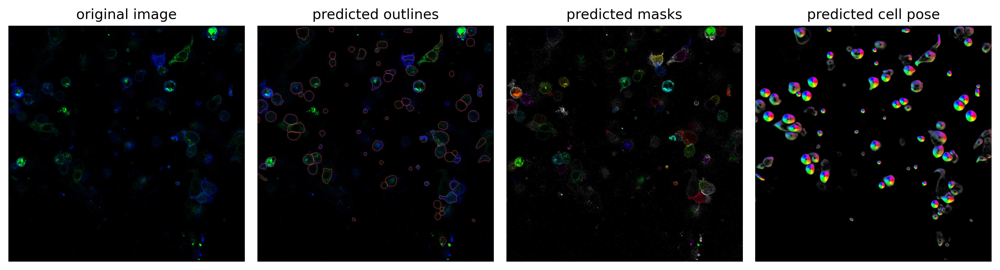

ap: [0.18478261 0.18478261 0.15957446 0.15957446 0.14736842 0.13541667
 0.1122449  0.09       0.03809524 0.         0.        ]
tp: [17. 17. 15. 15. 14. 13. 11.  9.  4.  0.  0.]
fp: [65. 65. 67. 67. 68. 69. 71. 73. 78. 82. 82.]
np: [10. 10. 12. 12. 13. 14. 16. 18. 23. 27. 27.]


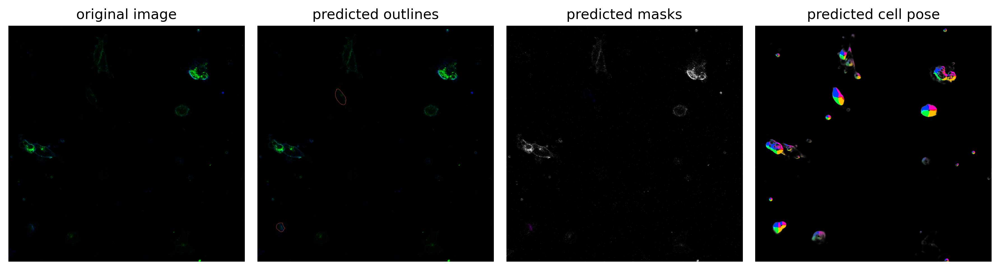

ap: [0.14285715 0.14285715 0.14285715 0.14285715 0.14285715 0.14285715
 0.14285715 0.         0.         0.         0.        ]
tp: [1. 1. 1. 1. 1. 1. 1. 0. 0. 0. 0.]
fp: [1. 1. 1. 1. 1. 1. 1. 2. 2. 2. 2.]
np: [5. 5. 5. 5. 5. 5. 5. 6. 6. 6. 6.]


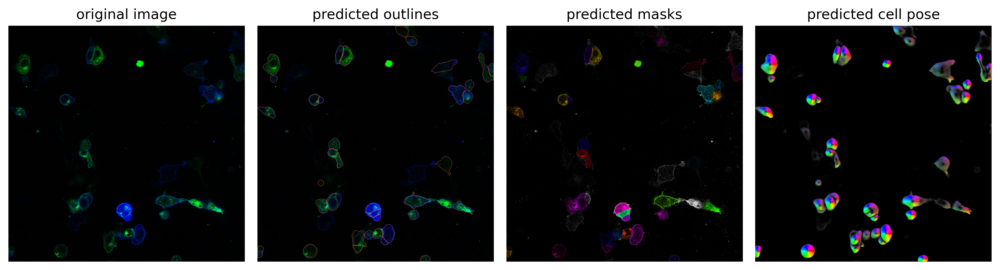

ap: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
tp: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
fp: [38. 38. 38. 38. 38. 38. 38. 38. 38. 38. 38.]
np: [31. 31. 31. 31. 31. 31. 31. 31. 31. 31. 31.]


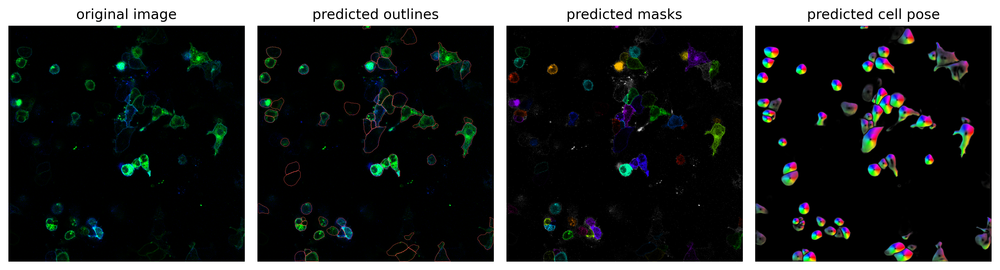

ap: [0.3802817  0.3802817  0.3802817  0.3802817  0.3611111  0.3611111
 0.25641027 0.20987654 0.06521739 0.         0.        ]
tp: [27. 27. 27. 27. 26. 26. 20. 17.  6.  0.  0.]
fp: [36. 36. 36. 36. 37. 37. 43. 46. 57. 63. 63.]
np: [ 8.  8.  8.  8.  9.  9. 15. 18. 29. 35. 35.]


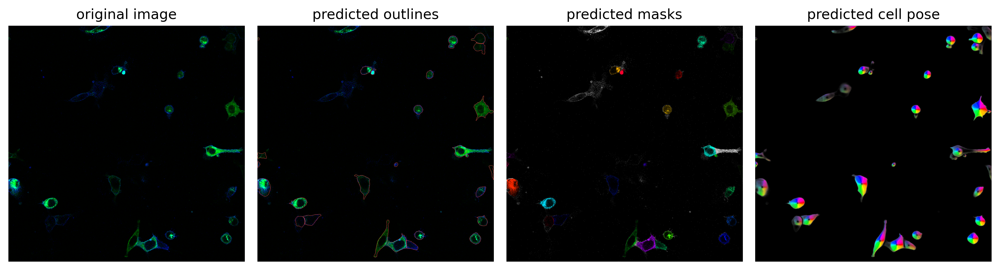

ap: [0.5862069  0.5862069  0.53333336 0.53333336 0.4375     0.4375
 0.3529412  0.21052632 0.02222222 0.         0.        ]
tp: [17. 17. 16. 16. 14. 14. 12.  8.  1.  0.  0.]
fp: [10. 10. 11. 11. 13. 13. 15. 19. 26. 27. 27.]
np: [ 2.  2.  3.  3.  5.  5.  7. 11. 18. 19. 19.]


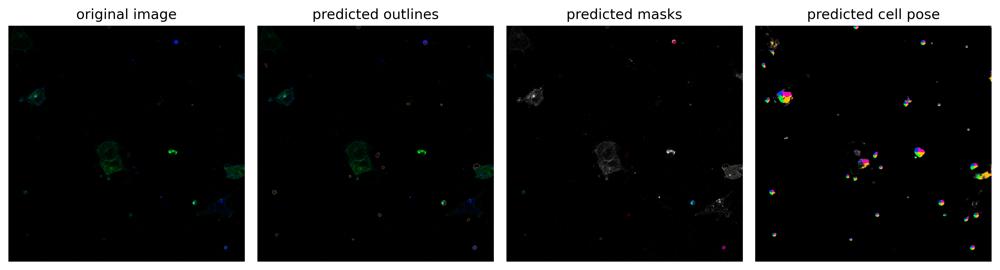

ap: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
tp: [0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
fp: [16. 16. 16. 16. 16. 16. 16. 16. 16. 16. 16.]
np: [5. 5. 5. 5. 5. 5. 5. 5. 5. 5. 5.]


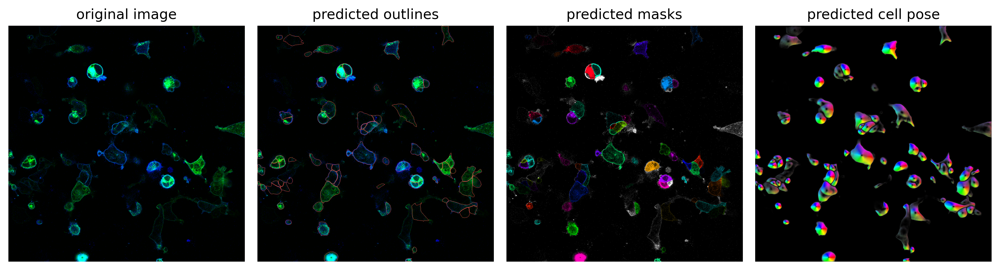

ap: [0.23529412 0.22093023 0.19318181 0.16666667 0.15384616 0.10526316
 0.10526316 0.09375    0.         0.         0.        ]
tp: [20. 19. 17. 15. 14. 10. 10.  9.  0.  0.  0.]
fp: [53. 54. 56. 58. 59. 63. 63. 64. 73. 73. 73.]
np: [12. 13. 15. 17. 18. 22. 22. 23. 32. 32. 32.]


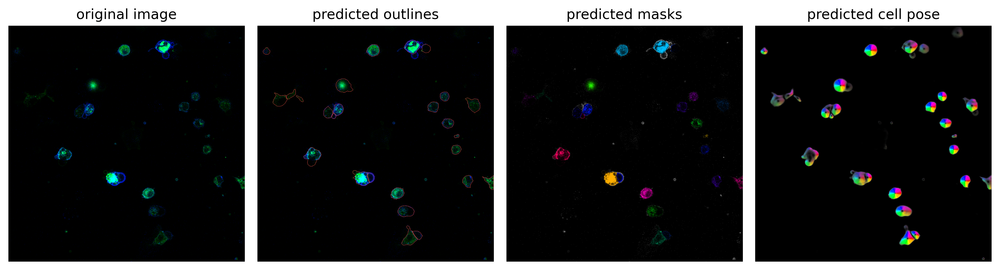

ap: [0.25       0.20689656 0.20689656 0.16666667 0.12903225 0.12903225
 0.12903225 0.09375    0.02941176 0.         0.        ]
tp: [7. 6. 6. 5. 4. 4. 4. 3. 1. 0. 0.]
fp: [19. 20. 20. 21. 22. 22. 22. 23. 25. 26. 26.]
np: [2. 3. 3. 4. 5. 5. 5. 6. 8. 9. 9.]


In [9]:
# DISPLAY RESULTS
for i in ds.image_ids:
    fig = plt.figure(figsize=(12,5))
    plot.show_segmentation(fig, ds.load_image(i), preds[i], flows[i], channels=channels)
    plt.tight_layout()
    plt.show()
    p = metrics.average_precision(gts[i], preds[i], tresholds)
    print('ap: {}\ntp: {}\nfp: {}\nnp: {}'.format(p[0],p[1],p[2],p[3]))

In [10]:
ap = metrics.average_precision(gts, preds, tresholds)[0]
print(ap.mean(axis=0))

[0.22242782 0.2152444  0.20201561 0.19367248 0.17146438 0.16389754
 0.13734362 0.08723786 0.01936833 0.         0.        ]
